# Explainer Notebook: Talking Tactics – Premier League Managers

This notebook is the **code companion** to the report  
*“Talking Tactics: A Text-Network Analysis of Managers in the Premier League”*.
It walks through the full pipeline used in the paper, from data collection and
cleaning, through network construction and community detection, to the final
visualizations and correlation analyses.

You can read this notebook from top to bottom as a narrative that mirrors the structure
of the report:
1. Data collection (Wikipedia pages + Kaggle standings)
2. Text cleaning and tactical vocabulary extraction
3. Multiplex network construction (tactical layer + shared‑club layer)
4. Community detection and visualization
5. Correlation between linguistic features and success
6. Era-based analyses and word clouds

## Imports & Setup

In [1]:
%pip install pycountry
%pip install python-louvain


Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [2]:
# Standard Library
import os
import re
import math
import html
import glob
import copy
import random
import zipfile
from collections import Counter
import shutil

# External APIs / Requests
import requests
import kagglehub
import pycountry

# Scientific Libraries
import numpy as np
import pandas as pd
from scipy.stats import pearsonr

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
from matplotlib.patches import Polygon as MplPolygon
from matplotlib.collections import PatchCollection
from scipy.spatial import ConvexHull

# Graph / Network Analysis
import networkx as nx
import community.community_louvain as community_louvain

# Web Scraping
from bs4 import BeautifulSoup

# NLP / Text Processing
import nltk
from nltk import pos_tag, word_tokenize
from nltk.corpus import stopwords, words, wordnet
from nltk.stem import WordNetLemmatizer
from nltk.sentiment import SentimentIntensityAnalyzer

# Machine Learning / Text Features
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

# NLTK Downloads
nltk.download('punkt')
nltk.download('punkt_tab')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger_eng')
nltk.download('words')
nltk.download('vader_lexicon')


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\astri\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to
[nltk_data]     C:\Users\astri\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\astri\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\astri\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger_eng to
[nltk_data]     C:\Users\astri\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger_eng is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package words to
[nltk_data]     C:\Users\astri\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-to-date!

True

In [3]:
random.seed(42)
np.random.seed(42)

In [4]:
# Download premier-league standings
path = kagglehub.dataset_download("evangower/english-premier-league-standings")

print("Path to dataset files:", path)

Path to dataset files: C:\Users\astri\.cache\kagglehub\datasets\evangower\english-premier-league-standings\versions\5


# Download and Load Base Data (Premier League standings)

Download the Premier League standings dataset from Kaggle, load all CSV files, and merge them into a single dataframe.
We extract teams and years to support later filtering of managers.


In [5]:
# Find all CSV files
csv_files = glob.glob(os.path.join(path, "*.csv"))

# Load and combine them
dfs = []
for file in csv_files:
    df = pd.read_csv(file)
    df["source_file"] = os.path.basename(file)
    dfs.append(df)

combined_df = pd.concat(dfs, ignore_index=True)

# Save combined CSV
combined_df.to_csv("premier_league_standings_combined.csv", index=False)
print("Saved combined CSV as premier_league_standings_combined.csv")

Saved combined CSV as premier_league_standings_combined.csv


In [6]:
teams = sorted(combined_df["team"].unique())
teams_df = pd.DataFrame(teams, columns=["team"])
teams_df.to_csv("premier_league_teams.csv", index=False)
prem_teams = set(teams)

years = sorted(combined_df["season_end_year"].unique())
years = [years[0] - 1] + years
years = [years[-1] + 1] + years

years_df = pd.DataFrame(years, columns=["season_end_year"])
years_df.to_csv("premier_league_years.csv", index=False)
prem_years = set(years)


# Load Project Files (Managers and Football terminology pages and categories)

Download and extract the project files containing manager biographies, football pages, and terminology documents.
An explainer notebook for these downloaded files is available in the repository at the following location: [Explainer Notebook to Download the Wikitexts](https://github.com/ahp9/social_graphs_02805_project/blob/main/Explainer_Notebook_Download_Files.ipynb)

In [7]:
ZIP_LOCAL = "social_graphs_project.zip"
EXTRACT_DIR = "social_graphs_02805_project-main"

# Always download the latest ZIP
url = "https://github.com/ahp9/social_graphs_02805_project/archive/refs/heads/main.zip"
r = requests.get(url); r.raise_for_status()
with open(ZIP_LOCAL, "wb") as f:
    f.write(r.content)

# Remove old folder if it exists
shutil.rmtree(EXTRACT_DIR, ignore_errors=True)

# Extract fresh repo
with zipfile.ZipFile(ZIP_LOCAL, "r") as z:
    z.extractall()


In [8]:
if not os.path.exists(EXTRACT_DIR):
    if not os.path.exists(ZIP_LOCAL):
        url = "https://github.com/ahp9/social_graphs_02805_project/archive/refs/heads/main.zip"
        r = requests.get(url); r.raise_for_status()
        with open(ZIP_LOCAL, "wb") as f:
            f.write(r.content)
    with zipfile.ZipFile(ZIP_LOCAL, "r") as z:
        z.extractall()

DATA_DIR_MANAGERS = os.path.join(EXTRACT_DIR, "managers_wikitext")
DATA_DIR_PAGES = os.path.join(EXTRACT_DIR, "football_pages_wikitext")
DATA_DIR_TERMINOLOGY = os.path.join(EXTRACT_DIR, "football_terminology_wikitext")

# Club & Career Extraction Utilities

Functions for normalizing club names and extracting managers’ clubs and coaching years from Wikipedia-style text.

In [9]:
# Normalize the club names so the clubs results fit the
# club names from the Wikipedia pages
CLUB_NORMALIZATION = {
    "birmingham city": "Birmingham City",
    "birmingham": "Birmingham City",
    "blackburn rovers": "Blackburn",
    "bolton wanderers": "Bolton",
    "afc bournemouth": "Bournemouth",
    "bournemouth": "Bournemouth",
    "brighton & hove albion": "Brighton",
    "brighton and hove albion": "Brighton",
    "charlton athletic": "Charlton Ath",
    "huddersfield town": "Huddersfield",
    "manchester united": "Manchester Utd",
    "newcastle united": "Newcastle Utd",
    "newcastle": "Newcastle Utd",
    "queens park rangers": "QPR",
    "sheffield united": "Sheffield Utd",
    "sheffield wednesday": "Sheffield Weds",
    "swansea city afc": "Swansea City",
    "swansea city": "Swansea City",
    "tottenham hotspur": "Tottenham",
    "spurs": "Tottenham",
    "west bromwich albion": "West Brom",
    "west bromwich": "West Brom",
    "west ham united": "West Ham",
    "wolverhampton wanderers": "Wolves",
    "wolverhampton": "Wolves",
}


def normalize_club(name):
    key = name.lower().strip()
    return CLUB_NORMALIZATION.get(key, name)

def normalize(name):
    return name.lower().replace("_", " ").strip()

In [10]:
def extract_clubs(text):
    """
    Extract manager clubs from infobox lines.
    - Keep caretaker and interim roles
    - Exclude assistant and first-team coach roles
    """
    clubs = set()

    # Get managerclubs lines
    matches = re.findall(r'\|\s*managerclubs\s*\d+\s*=\s*(.+)', text)

    for m in matches:
        lower = m.lower()

        if "(assistant" in lower:
          continue
        if "first-team coach" in lower:
          continue

        # extra the clubs name
        links = re.findall(r'\[\[([^|\]]+)(?:\|([^]]+))?\]\]', m)
        for a, b in links:
            club = b if b else a
            club = re.sub(r'\s*\(.*?\)', '', club)
            club = club.replace("F.C.", "").strip()
            club = normalize_club(club)
            if club:
                clubs.add(club)

        # clean and normalize clubs name
        plain = re.sub(r'\[\[.*?\]\]', '', m)
        plain = re.sub(r'\s*\(.*?\)', '', plain).strip()
        plain = normalize_club(plain)

        if plain and 1 <= len(plain.split()) <= 4:
            clubs.add(plain)
    return clubs

def extract_years(text):
    """
    Extract year ranges:
    - YYYY–YYYY
    - YYYY–
    - YYYY–present
    - Single year: YYYY
    Returns list of (start, end).
    """
    results = []

    # Find year ranges (XXXX - XXYY)
    range_pattern = r"(\d{4})\s*[–-]\s*(\d{0,4}|present|current)?"
    range_matches = re.findall(range_pattern, text.lower())

    for start, end in range_matches:
        start = int(start)

        if end in ("", None, "present", "current"):
            results.append((start, None))
        else:
            if len(end) == 2:
                end = int(start // 100 * 100 + int(end))
            else:
                end = int(end)
            results.append((start, end))

    # If single year then set it as (XXXX-XXXX)
    single_pattern = r"\b(\d{4})\b"
    single_matches = re.findall(single_pattern, text)

    for year in single_matches:
        year = int(year)
        if not any(r[0] == year for r in results):
            results.append((year, year))

    return results


def extract_club_year_pairs(text, prem_teams, prem_years):
    """
    Extract club, start_year, end_year.
    Keep ONLY clubs in Premier League list AND only years that overlap PL years.
    """
    # Fetch the managers clubs and years
    club_lines = re.findall(r'\|\s*managerclubs\s*(\d+)\s*=\s*(.+)', text)
    year_lines = re.findall(r'\|\s*manageryears\s*(\d+)\s*=\s*(.+)', text)

    # Extract year
    year_dict = {}
    for idx, ytext in year_lines:
        yrs = extract_years(ytext)
        year_dict[int(idx)] = yrs[0] if yrs else (None, None)

    pairs = []
    for idx, ctext in club_lines:
        idx = int(idx)

        # Extract club names
        clubs = list(extract_clubs(f"| managerclubs{idx} = {ctext}"))

        # Keep ONLY Premier League clubs
        clubs = [c for c in clubs if c in prem_teams]

        if not clubs:
            continue

        start, end = year_dict.get(idx, (None, None))

        # Skip if not in Prem
        if start not in prem_years and end not in prem_years:
            continue

        for c in clubs:
            pairs.append((c, start, end))

    return pairs

In [11]:
texts = {}
club_years = {}

for fname in os.listdir(DATA_DIR_MANAGERS):
    if not fname.endswith(".txt"):
        continue

    manager = fname[:-4].replace("_", " ")
    with open(os.path.join(DATA_DIR_MANAGERS, fname), encoding="utf-8") as f:
        raw = f.read()

    # Extract managers clubs and years
    pairs = extract_club_year_pairs(raw, prem_teams, prem_years)

    if len(pairs) == 0:
        continue

    texts[manager] = raw
    club_years[manager] = pairs

print(f"Extracted data for {len(texts)} valid managers.")


Extracted data for 284 valid managers.


# Text Analyzer
Define stopwords, blacklists, and cleaning rules used to preprocess manager biographies before TF-IDF analysis.

In [12]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction import text
import nltk
from nltk.corpus import words
nltk.download('words')

# Many HTML, CSS that we want removed
STOPWORDS_ANALYZER = text.ENGLISH_STOP_WORDS.union({
    "ref","refs","reference","references","retrieved","accessed","archive","archived",
    "url","https","http","www","com","org","net","title","web","cite","page","pages",
    "vol","vol.","no","isbn","issn","doi","pdf","category","external","link","links",
    "file","image","amp","nbsp","till","lguitar","color","bgcolor","font","style",
    "align","center","phrase","author","width","height","border","px","margin","padding","table","div",
    "span","textalign","left","rowspan","colspan","ruby","cellpadding","cellspacing","valign","class",
    "id","background","em","text","value","article", "added","concept","size","bar","scope","row","col","alb",
    "start","end","legend","template","infobox","thumb","gallery","metadata","nav",
    "content", "axis",
})

SECTION_CUT_ANALYZER = re.compile(r'(?im)^\s*(references|external\s+links|see\s+also|notes)\s*$')
lemmatizer = WordNetLemmatizer()
english_vocab_analyzer = set(map(str.lower, words.words()))

club_blacklist = set()
for pairs in club_years.values():
    for club, _, _ in pairs:
        for part in club.lower().split():
            club_blacklist.add(part)
        club_blacklist.add(club.lower())

manager_blacklist = set()
for name in texts.keys():
    for part in name.lower().split():
        manager_blacklist.add(part)

# No country and natioanlities
country_blacklist = set(c.name.lower() for c in pycountry.countries)
nationality_blacklist = {
    "english","spanish","french","german","italian","dutch","portuguese",
    "argentine","brazilian","uruguayan","chilean","danish","swedish",
    "norwegian","icelandic","scottish","welsh","irish"
}


[nltk_data] Downloading package words to
[nltk_data]     C:\Users\astri\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-to-date!


In [13]:
lemmatizer = WordNetLemmatizer()
english_vocab = set(map(str.lower, words.words()))

# Remove capitalized words
CAPITAL_WORDS = re.compile(r"\b[A-Z][a-zA-Z]+\b")
ALL_CAPS = re.compile(r"\b[A-Z]{2,}\b")

RE_BASE = [
    re.compile(r"\{\{[^}]+\}\}"),          # {{templates}}
    re.compile(r"\[\[[^\]]+\]\]"),         # [[links]]
    re.compile(r"http\S+|www\.\S+"),       # URLs
    re.compile(r"[^\x00-\x7F]+"),          # non-ascii
]

TOTAL_NAME_BLACKLIST = (
    club_blacklist |
    manager_blacklist |
    country_blacklist |
    nationality_blacklist |
    STOPWORDS_ANALYZER
)

def fast_clean_text(raw: str) -> str:
    if not raw:
        return ""

    t = html.unescape(raw)
    t = BeautifulSoup(t, "lxml").get_text(" ") # Remove HTML

    # Remove wiki/html patterns
    for r in RE_BASE:
        t = r.sub(" ", t)

    t = CAPITAL_WORDS.sub(" ", t)
    t = ALL_CAPS.sub(" ", t)
    t = t.lower()
    t = re.sub(r"[^a-z\s]", " ", t) # keep letters only
    t = re.sub(r"\s+", " ", t).strip() # normalize

    return t

def fast_is_garbage(w: str) -> bool:
    if len(w) < 3:
        return True
    if len(w) > 20:
        return True
    if w in TOTAL_NAME_BLACKLIST:
        return True
    if w not in english_vocab:
        return True
    return False

def make_analyzer(extra_stopwords=None):
    extra_stopwords = set(extra_stopwords or [])

    def analyzer(doc):
        doc = fast_clean_text(doc)
        toks = []
        for w in doc.split():
            if fast_is_garbage(w):
                continue
            w = lemmatizer.lemmatize(w)
            if w in extra_stopwords:
                continue
            toks.append(w)
        return toks

    return analyzer



In [14]:
analyzer = make_analyzer()

# Clean the texts with analyzer
cleaned_texts = {
    m: " ".join(analyzer(texts[m]))
    for m in texts
}

# Helper functions

These small helper functions keep the main analysis clean. They handle loading text, computing boosted TF-IDF features, extracting tactical keywords, and running community detection.


---
Loads all .txt files from the given folders and tokenizes them.
This ensures all text is cleaned and consistent before TF-IDF.

In [15]:
def load_docs_from_dirs(paths, analyzer):
    docs = []
    for path in paths:
        for fname in os.listdir(path):
            if fname.endswith(".txt"):
                with open(os.path.join(path, fname), encoding="utf-8") as f:
                    raw = f.read()
                    tokens = analyzer(raw)
                    docs.append(" ".join(tokens))
    return docs


Builds TF-IDF vectors for terminology + manager pages, then boosts tactical terms and downweights generic ones.
Returns the boosted matrix and similarity scores used to build the tactical network.

In [16]:
def compute_tactical_matrix(term_docs, manager_docs, extra_stopwords):
    docs = term_docs + manager_docs

    vec = TfidfVectorizer(
        analyzer=make_analyzer(extra_stopwords=extra_stopwords),
        min_df=0.0005,
        max_df=0.80,
        sublinear_tf=True,
        norm="l2"
    )

    X = vec.fit_transform(docs).toarray()
    vocab = vec.get_feature_names_out()

    num_terms = len(term_docs)
    mean_term_vec = X[:num_terms].mean(axis=0)

    # tactical boosting
    tactical_mask = (mean_term_vec > 0).astype(float)
    boost_factor = 3.0
    X_boosted = X * (1 + tactical_mask * boost_factor)

    generic_mask = (mean_term_vec == 0).astype(float)
    X_boosted = X_boosted * (1 - 0.3 * generic_mask)

    sim = cosine_similarity(X_boosted)

    return sim, X_boosted, vocab, num_terms, mean_term_vec

Extracts the most important tactical keywords for a specific manager based on their boosted TF-IDF vector.
Used for word clouds, era analysis, and interpreting tactical identity.

In [17]:
def get_boosted_weights(
        manager_name,
        X_boosted, vocab, names, mean_term_vec,
        alpha=2.0, top_k=500
    ):
    manager_idx = names.index(manager_name)
    mgr_vec = X_boosted[manager_idx]

    # Normalize per manager (so large pages do not dominate)
    mgr_vec = mgr_vec / (np.linalg.norm(mgr_vec) + 1e-9)

    generic_mask = (mean_term_vec == 0).astype(float)
    beta = 0.5

    # Boost the tatical words
    boosted = mgr_vec * (1 + alpha * mean_term_vec - beta * generic_mask)
    boosted = boosted / (boosted.max() + 1e-9)

    # Keep words that appear in the tactical texts
    tactical_words = [
        (vocab[i], boosted[i])
        for i in range(len(vocab))
        if mean_term_vec[i] > 0.005
    ]

    tactical_words = sorted(tactical_words, key=lambda x: x[1], reverse=True)

    return tactical_words[:top_k]

Runs the Louvain algorithm to detect communities in a network layer.
Used to find tactical clusters and shared-club groups.

In [18]:
def get_communities_louvain(G_layer, name):
    print(f"=== {name} — edges: {G_layer.number_of_edges()} ===")

    G = G_layer.copy()
    G.remove_edges_from(nx.selfloop_edges(G))

    try:
        partition = community_louvain.best_partition(G, weight='weight', random_state=42)
        return partition
    except Exception as e:
        print(f"Louvain failed for {name}: {e}")
        return None

Compares a layer’s observed modularity to randomized networks.
Checks whether the detected communities are meaningful or just noise.

In [19]:
def modularity_significance(G, partition, n_random=50, name="layer"):
    M = community_louvain.modularity(partition, G)
    print(f"{name}: modularity M = {M:.4f}")

    M_c = []
    for i in range(n_random):
        Gr = copy.deepcopy(G)
        nx.double_edge_swap(Gr, nswap=10 * Gr.number_of_edges(), max_tries=100 * Gr.number_of_edges())
        part_r = community_louvain.best_partition(Gr, weight='weight')
        M_c.append(community_louvain.modularity(part_r, Gr))

    M_c = np.array(M_c)
    mu, sigma = M_c.mean(), M_c.std()

    print(f"{name}: null mean={mu:.4f}, std={sigma:.4f}")

    return {
        "M": M,
        "M_c": M_c,
        "mu": mu,
        "sigma": sigma
    }

# Build Tactical & Shared-Club Network Layers

In this section we construct the two layers of the multiplex network:

- Tactical layer: connects managers with similar tactical vocabulary
- Shared-club layer: connects managers who coached the same Premier League club

To do this, we first load football terminology pages, compute boosted TF-IDF vectors, extract tactical scores for each manager, and finally assign edges based on either club history or tactical similarity.

Load terminology documents and compute tactical similarity

In [20]:
# Load terminology documentss
terminology_docs = load_docs_from_dirs(
    [DATA_DIR_PAGES, DATA_DIR_TERMINOLOGY],
    analyzer
)

# Compute boosted TF-IDF vectors and similarity matrix for tactical terminology
(similarity,
 X_boosted,
 vocab,
 num_terms,
 mean_term_vec) = compute_tactical_matrix(
     terminology_docs,
     list(cleaned_texts.values()),
     extra_stopwords={"player","season","club","match","game","head","coach","league"}
)

Initalize the two graphs layers and add manager attributes

In [21]:
# Initialize the graph layers
managers_list = list(cleaned_texts.keys())
layer_names = ["shared_club", "tactical"]
layers = {name: nx.Graph() for name in layer_names}


# Add nodes
for manager in cleaned_texts.keys():
    for G_layer in layers.values():
        G_layer.add_node(manager)

# Add attributes
for manager, pairs in club_years.items():
    if pairs:
        valid_years = [
          year for (_, start, end) in pairs
          for year in prem_years
          if start <= year <= (end if end else max(prem_years))
        ]
        start_year = min(valid_years) if valid_years else None
    else:
        start_year = None

    for G_layer in layers.values():
        G_layer.nodes[manager]["type"] = "manager"
        G_layer.nodes[manager]["text"] = cleaned_texts[manager]
        G_layer.nodes[manager]["start_year"] = start_year

num_terms = len(terminology_docs)

manager_tactical_scores = {}

# Create and find a tatical score
for m in managers_list:
    weights = get_boosted_weights(
        m,
        X_boosted[num_terms:],
        vocab,
        managers_list,
        mean_term_vec,
        top_k=300
    )

    score = np.mean([w for _, w in weights])
    manager_tactical_scores[m] = score

# Assign tactical scores as attribute
G_sc = layers["shared_club"]
G_tac = layers["tactical"]

for m, score in manager_tactical_scores.items():
    G_sc.nodes[m]["tactical_score"] = score
    G_tac.nodes[m]["tactical_score"] = score


Add edges for the shared-club layer, that is edges between managers who coached the same club

In [22]:
for m1, pairs1 in club_years.items():
    for m2, pairs2 in club_years.items():
        if m1 >= m2:
            continue
        for c1, _, _ in pairs1:
            for c2, _, _ in pairs2:
                if c1 == c2:
                    G_sc.add_edge(m1, m2, club=c1)
                    break

Add edges for the tacctical-similarity layer

In [23]:
diffs = []

for i, m1 in enumerate(managers_list):
    s1 = G_tac.nodes[m1]["tactical_score"]

    for j, m2 in enumerate(managers_list):
        if j <= i:
            continue

        s2 = G_tac.nodes[m2]["tactical_score"]
        diffs.append(abs(s1 - s2))

diffs = np.array(diffs)

def choose_threshold_from_diffs(diffs, connectivity_level):
    """
    connectivity_level in [0,1]:
      0   -> very strict (more, tighter communities)
      0.5 -> medium
      1   -> loose (fewer communities)
    """
    p10 = np.percentile(diffs, 10)
    p30 = np.percentile(diffs, 30)
    return p10 + connectivity_level * (p30 - p10)

# Determine threshold for linking managers with similar tactical scores
grade_threshold = choose_threshold_from_diffs(diffs, connectivity_level=0.1)
print("Grade threshold: ", grade_threshold)

# Add edges based on tactical score similarity
for i, m1 in enumerate(managers_list):
    score1 = manager_tactical_scores[m1]

    for j, m2 in enumerate(managers_list):
        if j <= i:
            continue

        score2 = manager_tactical_scores[m2]
        diff = abs(score1 - score2)
        sim = 1 - diff

        if diff < grade_threshold:
            G_tac.add_edge(m1, m2, weight=sim)

Grade threshold:  0.013703701655317709


In [24]:
for name, G in layers.items():
    print(f"\n{name.upper()} LAYER")
    print("Nodes:", G.number_of_nodes())
    print("Edges:", G.number_of_edges())
    print("Density:", nx.density(G))
    print("Average degree:", np.mean([d for _, d in G.degree()]))
    print("----------")




SHARED_CLUB LAYER
Nodes: 284
Edges: 5235
Density: 0.1302692479968148
Average degree: 36.86619718309859
----------

TACTICAL LAYER
Nodes: 284
Edges: 4830
Density: 0.12019111133230478
Average degree: 34.014084507042256
----------


### Graph visualization

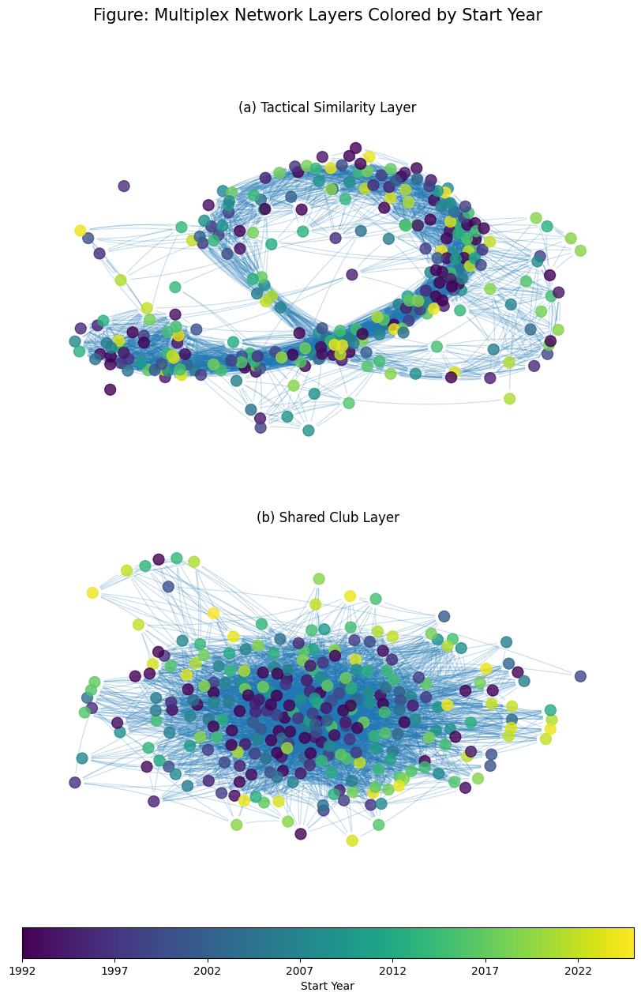

In [25]:
def plot_layer_graph_axes(ax, G_layer, node_data, cmap, norm, title, seed=42):
    """Plot a single multiplex layer on a given Axes."""

    # Empty graph
    if G_layer.number_of_edges() == 0:
        ax.text(0.5, 0.5, "No links detected", ha="center", va="center")
        ax.set_title(title)
        ax.axis("off")
        return

    # Add nodes with data
    for n in G_layer.nodes():
        if n in node_data:
            for k, v in node_data[n].items():
                G_layer.nodes[n][k] = v

    default_year = np.mean([v["start_year"] for v in node_data.values() if "start_year" in v])
    for n in G_layer.nodes():
        if G_layer.nodes[n].get("start_year") is None:
            G_layer.nodes[n]["start_year"] = default_year

    # Node color
    node_colors = [
        cmap(norm(G_layer.nodes[n]["start_year"]))
        for n in G_layer.nodes()
    ]

    pos = nx.spring_layout(G_layer, seed=seed, k=1.8, iterations=200)

    nx.draw_networkx_nodes(
        G_layer, pos, node_color=node_colors,
        node_size=100, alpha=0.8, ax=ax
    )
    nx.draw_networkx_edges(
        G_layer, pos, edge_color="tab:blue",
        width=0.8, alpha=0.25, arrows=True,
        connectionstyle="arc3,rad=0.08", ax=ax
    )

    ax.set_title(title)
    ax.axis("off")


all_years = []
for name in ["tactical", "shared_club"]:
    for n in layers[name].nodes():
        y = layers[name].nodes[n].get("start_year")
        if y is not None:
            all_years.append(y)

if not all_years:
    all_years = [1992, 2025]

min_year, max_year = min(all_years), max(all_years)
cmap = plt.cm.viridis
norm = plt.Normalize(min_year, max_year)

# Plot both layers
fig, axes = plt.subplots(2,1, figsize=(10, 14))

plot_layer_graph_axes(
    axes[0],
    layers["tactical"],
    node_data=G_tac.nodes,
    cmap=cmap,
    norm=norm,
    title="(a) Tactical Similarity Layer"
)

plot_layer_graph_axes(
    axes[1],
    layers["shared_club"],
    node_data=G_sc.nodes,
    cmap=cmap,
    norm=norm,
    title="(b) Shared Club Layer"
)

# Shared colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])

cbar = fig.colorbar(
    sm, ax=axes, orientation="horizontal",
    fraction=0.05, pad=0.18
)
cbar.set_label("Start Year")
cbar.set_ticks(range(min_year, max_year + 1, 5))

fig.suptitle("Figure: Multiplex Network Layers Colored by Start Year", fontsize=15)
plt.subplots_adjust(top=0.88, bottom=0.20, wspace=0.25)

plt.savefig("network.png")
plt.show()


# Detecting Communities in Tactical and Shared-Club Layer

Run the Louvain community detection algorithm on both network layers, assign community labels to managers, and compare how tactical and shared-club structures group managers.

In [26]:
# Tactical layer
partition_tac = get_communities_louvain(G_tac, "tactical")
nx.set_node_attributes(G_tac, partition_tac, name="tactical_community")
comm_sizes_tac = Counter(partition_tac.values())
print("Tactical communities:", comm_sizes_tac)

# Shared-club layer
partition_s_club = get_communities_louvain(G_sc, "shared_club")
nx.set_node_attributes(G_sc, partition_s_club, name="sharedclub_community")
comm_sizes_sc = Counter(partition_s_club.values())
print("Shared-club communities:", comm_sizes_sc)

# Add Both to your master graph G_layer
nx.set_node_attributes(G_layer, partition_tac, name="tactical_community")
nx.set_node_attributes(G_layer, partition_s_club, name="sharedclub_community")


=== tactical — edges: 4830 ===
Tactical communities: Counter({0: 45, 2: 45, 10: 45, 3: 43, 4: 39, 5: 31, 7: 21, 1: 8, 11: 3, 8: 2, 9: 1, 6: 1})
=== shared_club — edges: 5235 ===
Shared-club communities: Counter({5: 63, 1: 51, 2: 50, 4: 45, 6: 37, 0: 20, 3: 18})


Find modularity for both partitions

In [27]:
res_tac = modularity_significance(G_tac, partition_tac, n_random=50, name="tactical")
res_sc  = modularity_significance(G_sc,  partition_s_club, n_random=50, name="shared_club")

tactical: modularity M = 0.5844
tactical: null mean=0.1256, std=0.0030
shared_club: modularity M = 0.2919
shared_club: null mean=0.1141, std=0.0029


### Visualization Functions for Community and Club Analysis

Helper functions for plotting community structure, tactical score distributions, club consistency, and combined tactical/era characteristics across managers.

---

The first panel shows how each community varies in tactical strength, so we can see whether some groups are tactically stronger or more diverse than others. The second panel shows when managers in each community began their careers, revealing whether the communities also capture coaching “generations” or historical eras.

Together, these two views tell us whether communities are formed mainly through tactical similarity, shared coaching eras, or a mix of both.

In [28]:
def plot_combined_tactical_and_era(partition, tactical_scores, manager_years):
    df_scores = pd.DataFrame([
        {"community": partition[m], "tactical_score": tactical_scores[m]}
        for m in partition
    ])

    df_years = pd.DataFrame([
        {"community": partition[m], "year": manager_years[m]}
        for m in partition
        if manager_years[m] is not None
    ])

    # Create subplots
    fig, axes = plt.subplots(2, 1, figsize=(14, 10), sharex=True)
    fig.suptitle(
        "Community Characteristics: Tactical Scores and Era Start Distribution",
        fontsize=18,
        y=0.98
    )

    # Tactical Score Boxplot
    sns.boxplot(
        data=df_scores,
        x="community",
        y="tactical_score",
        hue="community",
        palette="crest",
        ax=axes[0],
        legend=False
    )
    axes[0].set_title("(a) Tactical Score Distribution per Community")

    # Start-Year Boxplot
    sns.boxplot(
        data=df_years,
        x="community",
        y="year",
        color="lightgray",
        showfliers=False
    )

    sns.stripplot(
        data=df_years,
        x="community",
        y="year",
        hue="community",
        palette="crest",
        dodge=False,
        alpha=0.7,
        legend=False
    )
    axes[1].set_title("(b) Start-Year Distribution per Community")

    # Shared x-axis label
    axes[1].set_xlabel("Community")
    plt.show()


This plot shows how many different communities each club appears in versus how many managers it has had. It helps us understand whether club identity stays consistent or shifts across managers.

In [29]:
def count_managers_per_club(club_years):
    club_manager_count = {}
    for m, clubs in club_years.items():
        for club, _, _ in clubs:
            club_manager_count[club] = club_manager_count.get(club, 0) + 1
    return club_manager_count

def get_club_to_communities(partition, club_years):
    club_to_comms = {}

    for m, pairs in club_years.items():
        for club, _, _ in pairs:
            club_to_comms.setdefault(club, set()).add(partition[m])

    return club_to_comms

def compute_club_consistency(partition, club_years):
    club_to_comms = get_club_to_communities(partition, club_years)

    consistency = {}
    for club, comms in club_to_comms.items():
        consistency[club] = {
            "num_communities": len(comms),
            "communities": sorted(list(comms)),
            "consistent": (len(comms) == 1)
        }
    return consistency

In [30]:
def plot_club_community_scatter(partition, club_years, community_label="Shared-Club"):
    results = compute_club_consistency(partition, club_years)
    club_manager_counts = count_managers_per_club(club_years)

    # Build dataframe
    rows = []
    for club, info in results.items():
        rows.append({
            "club": club,
            "num_managers": club_manager_counts[club],
            "num_communities": info["num_communities"],
            "communities": info["communities"],
            "consistent": info["consistent"]
        })
    df = pd.DataFrame(rows)

    # Correlation
    corr = np.corrcoef(df["num_managers"], df["num_communities"])[0, 1]

    # Plot
    plt.figure(figsize=(14, 5))

    sns.regplot(
        data=df,
        x="num_managers",
        y="num_communities",
        scatter_kws={'alpha': 0.8, 's': 120},
        line_kws={'color': 'black', 'lw': 2, 'alpha': 0.7}
    )

    sns.scatterplot(
        data=df,
        x="num_managers",
        y="num_communities",
        hue="num_communities",
        palette="crest",
        s=130,
        alpha=0.85,
        legend=False
    )

    plt.text(
        df["num_managers"].max() * 0.65,
        df["num_communities"].max() * 0.7,
        f"r = {corr:.2f}",
        fontsize=13
    )

    plt.xlabel("Number of Managers for This Club")
    plt.ylabel(f"Number of {community_label} Communities")
    plt.title(f"Club – {community_label} Consistency: Managers vs {community_label} Communities")

    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()


This visualization overlays the two partitions: tactical communities (hulls) and shared-club communities (node colors). It shows how strongly the two grouping methods agree or cut across one another.

In [31]:
def plot_communities(G_layer, pos, filename="communities.png"):
    nodes = list(G_layer.nodes())

    tactical = nx.get_node_attributes(G_layer, 'tactical_community')
    sharedclub = nx.get_node_attributes(G_layer, 'sharedclub_community')
    comms_tactical = np.array([tactical[n] for n in nodes])
    comms_shared = np.array([sharedclub[n] for n in nodes])

    # Layout coordinates
    xs = np.array([pos[n][0] for n in nodes])
    ys = np.array([pos[n][1] for n in nodes])

    fig, ax = plt.subplots(figsize=(10, 8))
    for spine in ax.spines.values():
        spine.set_visible(False)

    # Create convex hull
    patches = []
    colors = []
    unique_comms = np.unique(comms_tactical)

    cmap_hulls = plt.cm.Set3
    num_colors = len(unique_comms)

    for i, c in enumerate(unique_comms):
        mask = comms_tactical == c
        pts = np.vstack([xs[mask], ys[mask]]).T

        # Need at least 3 points for a hull
        if len(pts) < 3:
            continue

        hull = ConvexHull(pts)
        hull_pts = pts[hull.vertices]

        poly = MplPolygon(hull_pts, closed=True)
        patches.append(poly)
        colors.append(cmap_hulls(i / (num_colors - 1)))

    # Add convex hull patches
    if patches:
        pc = PatchCollection(
            patches,
            facecolor=colors,
            edgecolor='black',
            alpha=0.3
        )
        ax.add_collection(pc)

    # Scatter plot for nodes
    sc = ax.scatter(
        xs, ys,
        c=comms_shared,
        cmap='viridis',
        s=55,
        edgecolor='black',
        linewidth=0.3
    )

    cbar = plt.colorbar(sc, ax=ax)
    cbar.set_label("Shared-Club Community")

    ax.set_xticks([])
    ax.set_yticks([])

    plt.tight_layout()
    plt.savefig(filename)
    plt.show()


The heatmap measures how much each tactical and shared-club community overlaps.
This reveals where the partitions agree and where they behave independently.

In [32]:
def plot_community_overlap_heatmap(df, filename="overlap.png"):
    cont = pd.crosstab(df["tac"], df["sc"])

    # Community sizes
    tac_sizes = cont.sum(axis=1)
    sc_sizes = cont.sum(axis=0)

    denom = pd.DataFrame(
        np.minimum.outer(tac_sizes.values, sc_sizes.values),
        index=cont.index,
        columns=cont.columns
    )

    # Size-normalized overlap (%)
    # ---  Relative to smaller community
    pct_size_norm = cont / denom * 100

    # Plot heatmap
    plt.figure(figsize=(8, 6))
    sns.heatmap(
        pct_size_norm,
        annot=True,
        fmt=".1f",
        cmap="viridis"
    )

    plt.xlabel("Shared-Club Community")
    plt.ylabel("Tactical Community")

    cbar = plt.gca().collections[0].colorbar
    cbar.set_label("Overlap (% relative to smaller community)")

    plt.tight_layout()
    plt.title("Community Overlap Heatmap")
    plt.savefig(filename)
    plt.show()


The word clouds show the most characteristic keywords for each community, giving a quick sense of their tactical or stylistic themes.

In [33]:
managers_df = pd.DataFrame({
    "manager": list(cleaned_texts.keys()),
    "tactical_score": [manager_tactical_scores[m] for m in cleaned_texts.keys()],
    "tactical_comm": [partition_tac[m] for m in cleaned_texts.keys()],
    "sharedclub_comm": [partition_s_club[m] for m in cleaned_texts.keys()]
})

name_list = list(cleaned_texts.keys())

all_manager_keywords = {}

for m in managers_list:
    all_manager_keywords[m] = get_boosted_weights(
        m,
        X_boosted[num_terms:],
        vocab,
        managers_list,
        mean_term_vec,
        top_k=300
    )



In [34]:
def plot_wordcloud_communities(managers_df, all_manager_keywords, community_col, score_col=None):
    manager_comm_map = managers_df.set_index("manager")[community_col]
    communities = sorted(managers_df[community_col].unique())

    if score_col is not None:
        avg_score_by_comm = (
            managers_df.groupby(community_col)[score_col]
            .mean()
            .to_dict()
        )
    else:
        avg_score_by_comm = {}

    cols = 2
    rows = int(np.ceil(len(communities) / cols))
    fig, axes = plt.subplots(rows, cols, figsize=(18, 6 * rows))
    axes = axes.flatten()

    plot_index = 0

    for comm in communities:
        if score_col is not None:
            avg_score = avg_score_by_comm.get(comm, float("nan"))
        else:
            avg_score = None

        # Collect all words from each communities
        combined_words = []
        for manager, words in all_manager_keywords.items():
            if manager not in manager_comm_map:
                continue
            if manager_comm_map[manager] != comm:
                continue

            combined_words.extend(words)

        if len(combined_words) == 0:
            print(f"No words found for community {comm}, skipping.")
            axes[plot_index].axis("off")
            plot_index += 1
            continue

        # Find unique wrods
        unique_words = {}
        for word, score in combined_words:
            if score is None or isinstance(score, float) and np.isnan(score):
                continue
            if word not in unique_words or score > unique_words[word]:
                unique_words[word] = score

        if len(unique_words) == 0:
            print(f"All scores zero in community {comm}, skipping.")
            axes[plot_index].axis("off")
            plot_index += 1
            continue

        sorted_words = sorted(unique_words.items(), key=lambda x: x[1], reverse=True)

        top_n = max(1, int(len(sorted_words) * 0.25))
        top_words = dict(sorted_words[:top_n])

        # Generate Wordlcloud
        wc = WordCloud(width=1000, height=600, background_color="white")
        wc_img = wc.generate_from_frequencies(top_words)

        axes[plot_index].imshow(wc_img)
        axes[plot_index].axis("off")

        if avg_score is not None:
            axes[plot_index].set_title(
                f"Community {comm}\nAvg Score = {avg_score:.3f}",
                fontsize=16
            )
        else:
            axes[plot_index].set_title(
                f"Community {comm}",
                fontsize=16
            )

        plot_index += 1

    for i in range(plot_index, len(axes)):
        axes[i].axis("off")

    plt.tight_layout()
    plt.show()


## Community analysis and plots

### Tactical layer - communities
Here we first examine the tactical communities on their own. We look at their score and era patterns, how consistently clubs stay within each group, and the keywords that characterise them. This gives a basic picture of what the tactical partition captures.


In [35]:
manager_years = {
    m: G_layer.nodes[m].get("start_year")
    for m in G_layer.nodes
}

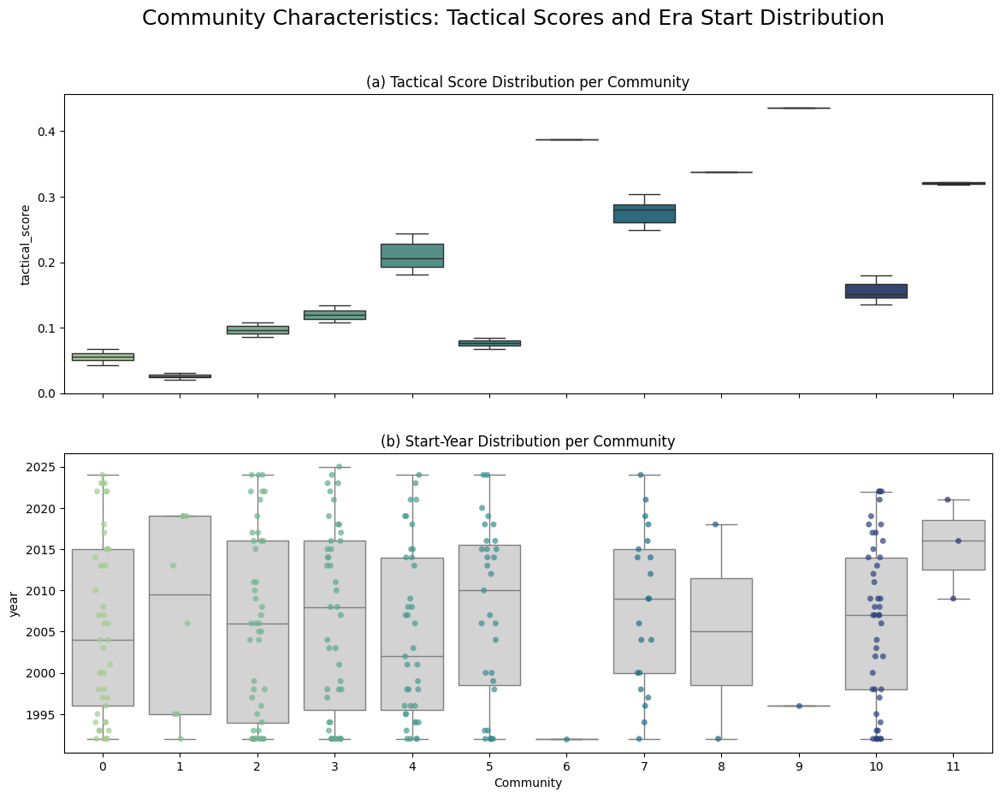

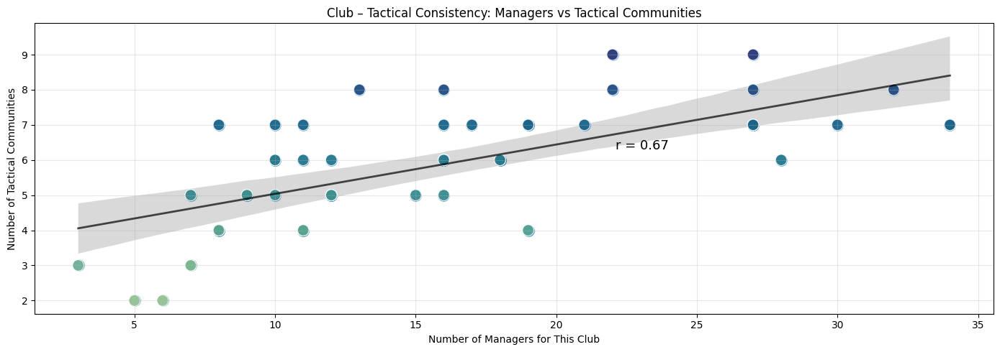

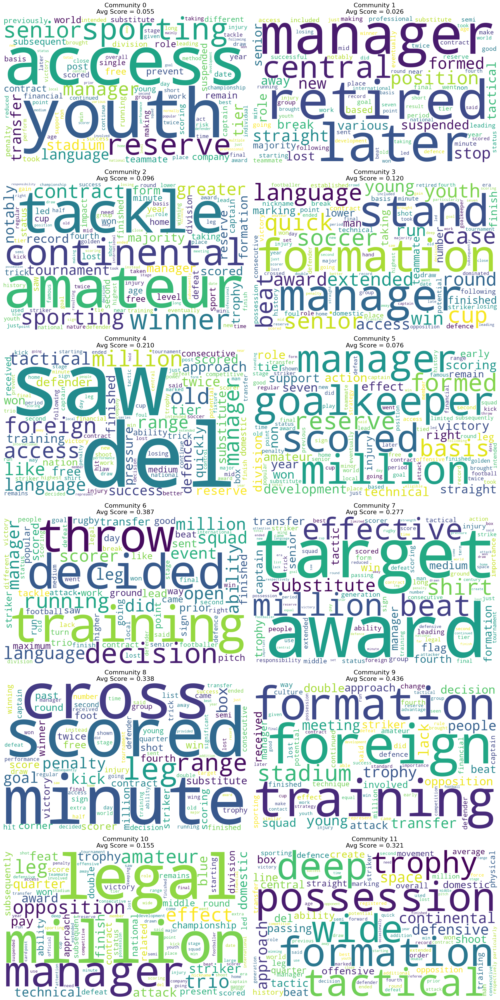

In [36]:
plot_combined_tactical_and_era(partition_tac, manager_tactical_scores, manager_years)
plot_club_community_scatter(partition_tac, club_years, community_label="Tactical")
plot_wordcloud_communities(
    managers_df,
    all_manager_keywords,
    community_col="tactical_comm",
    score_col="tactical_score"
)


The tactical groups show clear differences in score levels, some era clustering, and distinct keyword themes. Clubs vary in how consistently they fall within a single tactical community, but the relationship is not very strong. Overall, this partition reflects meaningful stylistic differences between managers.

### Share-club layer - communities
Next, we explore the shared-club communities in the same way. This helps us see whether these groups relate more to club history, coaching eras, or general managerial themes.


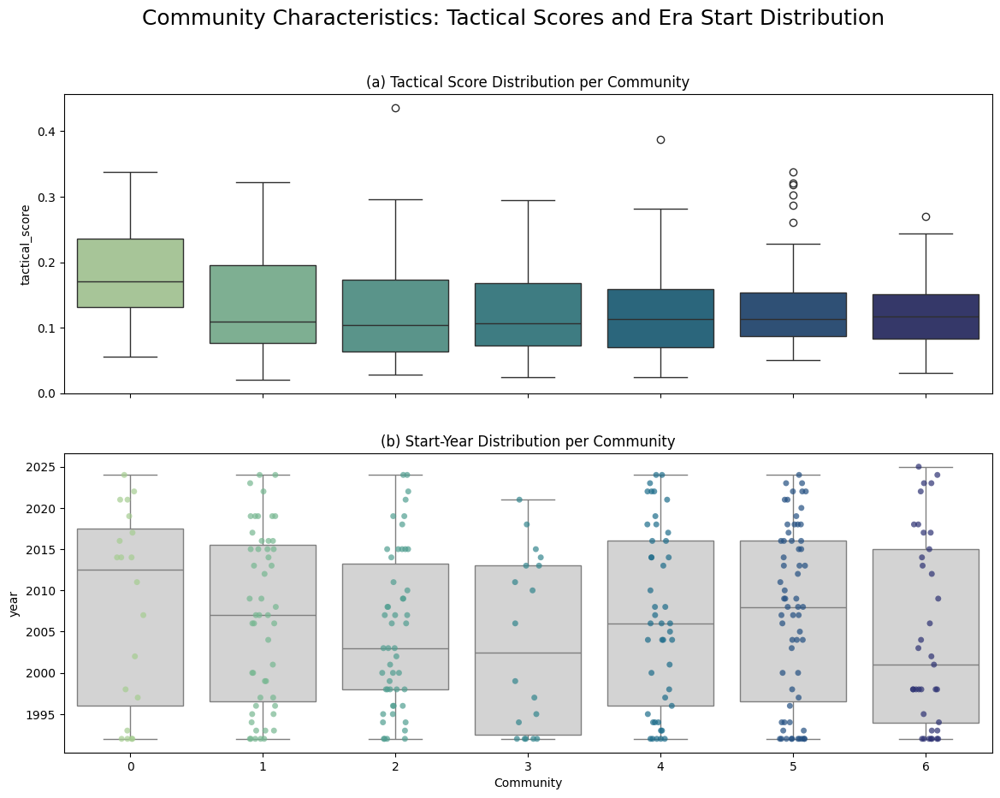

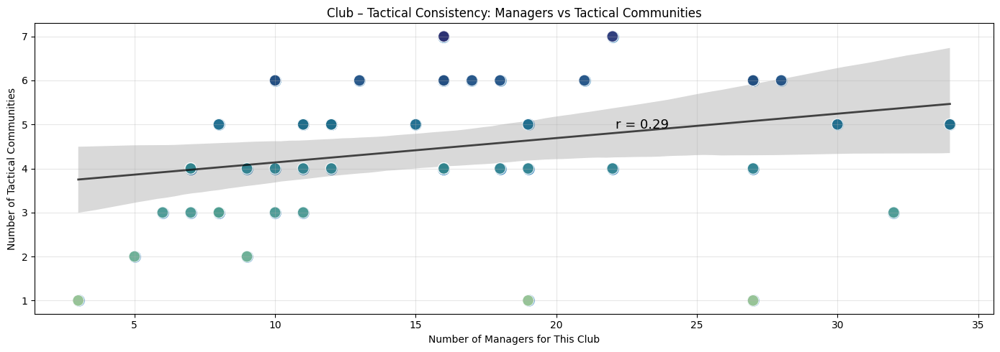

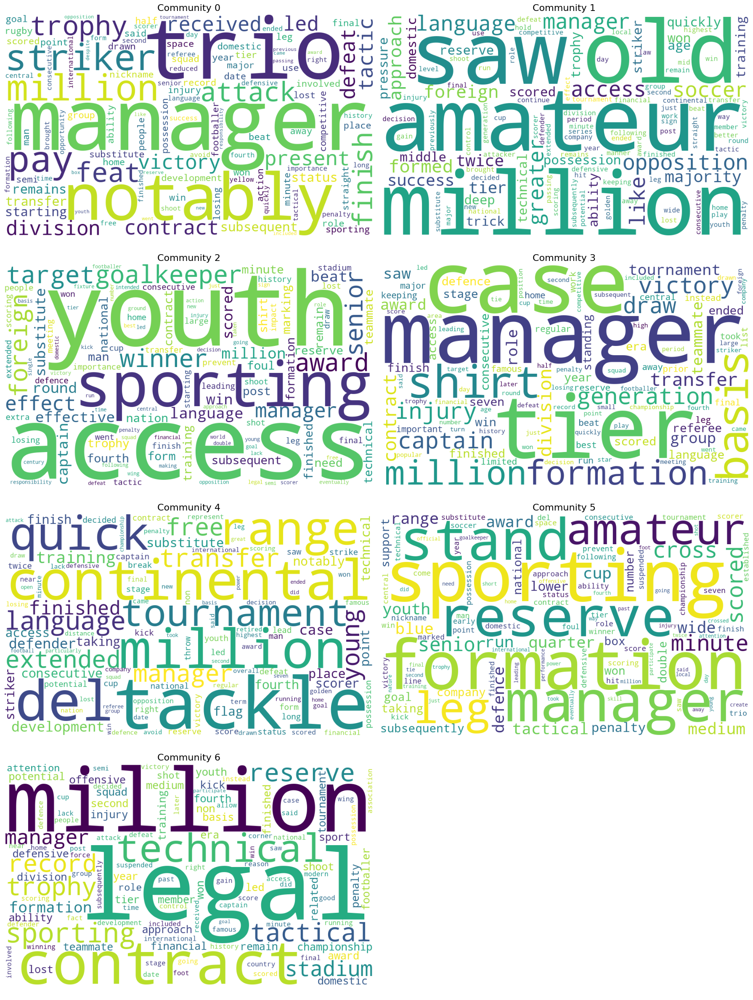

In [37]:
plot_combined_tactical_and_era(partition_s_club, manager_tactical_scores, manager_years)
plot_club_community_scatter(partition_s_club, club_years, community_label="Tactical")
plot_wordcloud_communities(
    managers_df,
    all_manager_keywords,
    community_col="sharedclub_comm",
    score_col=None
)


The shared-club communities show more mixed score and era patterns and less distinct thematic separation. Clubs with many managers tend to appear in more communities, but the trend is weak. These communities appear broader and less cohesive than the tactical ones.

### Compare the partitions directly
After completing the checks above, it was still difficult to see any clear relationship between the two partitions. Because of this, we created a set of comparative visualisations, a layout view, an overlap heatmap, and a simple correlation, to better assess whether tactical similarity and shared-club background align or represent different structures.

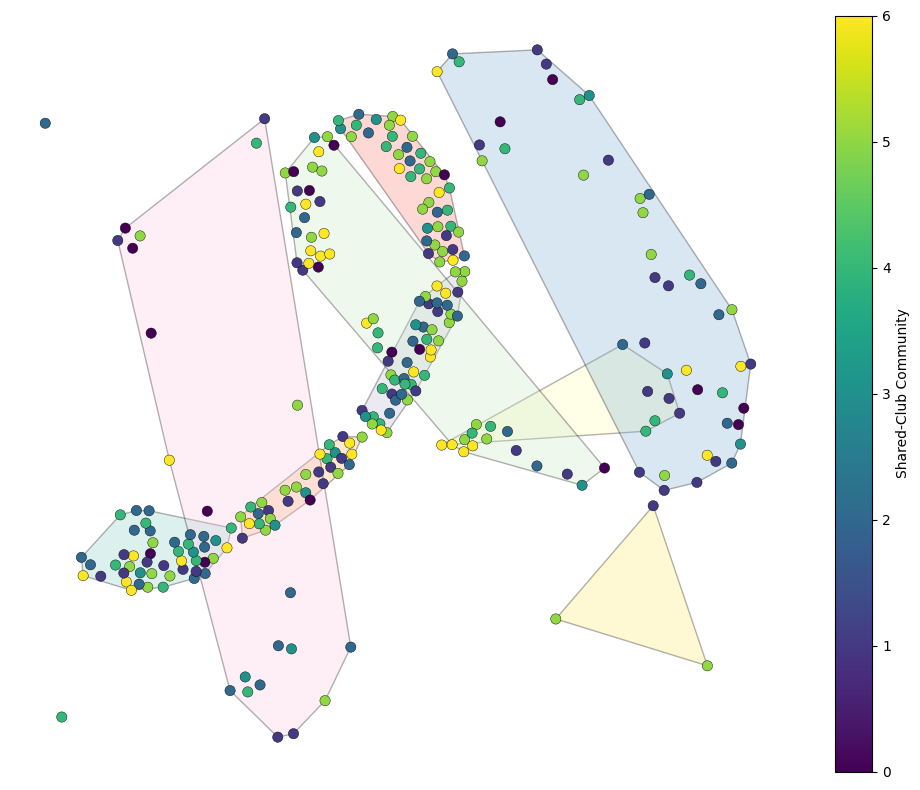

In [38]:
pos = nx.spring_layout(G_layer, seed=42, k=0.3)
plot_communities(G_layer, pos)

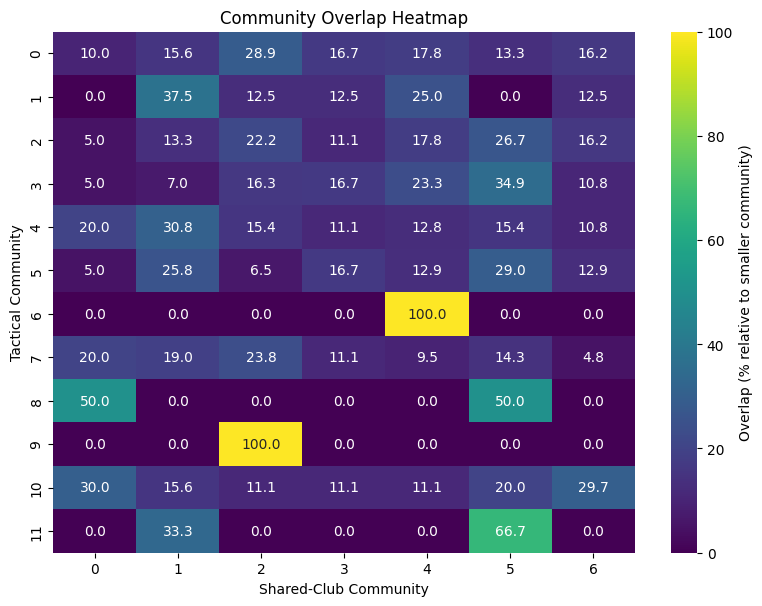

In [39]:
df = pd.DataFrame({
    "tac": [partition_tac[m] for m in managers_list],
    "sc":  [partition_s_club[m] for m in managers_list]
})

plot_community_overlap_heatmap(df)



In [40]:
r_tac, p_tac = pearsonr(df["tac"], df["sc"])

print("Correlation (Tactical Score Community vs Shared-Club Community)")
print("  r =", r_tac)
print("  p =", p_tac)

Correlation (Tactical Score Community vs Shared-Club Community)
  r = -0.013170034400458538
  p = 0.8251110479570373


The two partitions do not align strongly. The layout shows shared-club colours scattered across different tactical regions, the overlap heatmap confirms limited shared membership, and the correlation is close to zero. This indicates that the partitions capture largely independent relationships.

# Correlation between sentiment, tactical score, sc and historical success

In this section we examine how sentiment relates to tactical performance, community assignments, and historical success. We look at simple correlations and scatterplots to see whether managers who score higher tactically, win more points, or earn more titles also tend to be described more positively in text.

In [41]:
sia = SentimentIntensityAnalyzer()

manager_sentiment = {}

for manager, text in cleaned_texts.items():
    if text is None or len(text.strip()) == 0:
        manager_sentiment[manager] = 0.0
        continue

    scores = sia.polarity_scores(text)
    manager_sentiment[manager] = scores["compound"]


In [42]:
managers_df["sentiment"] = managers_df["manager"].map(manager_sentiment)

manager_start_year = nx.get_node_attributes(G_layer, "start_year")


In [43]:
last_pl_year = combined_df["season_end_year"].max()

rows = []

for manager, spans in club_years.items():

    for club, start, end in spans:
        if start is None:
            continue

        end = end if end is not None else last_pl_year

        club_rows = combined_df[combined_df["team"] == club]
        mask = (club_rows["season_end_year"] >= start) & \
               (club_rows["season_end_year"] <= end)

        for _, row in club_rows[mask].iterrows():
            rows.append({
                "manager": manager,
                "club": club,
                "season_end_year": row["season_end_year"],
                "position": row["position"],
                "points": row["points"]
            })

manager_results = pd.DataFrame(rows)

agg_results = manager_results.groupby("manager").agg(
    avg_points=("points", "mean"),
    best_position=("position", "min"),
    seasons_managed=("season_end_year", "nunique")
).reset_index()

agg_results["start_year"] = agg_results["manager"].map(manager_start_year)



In [44]:
titles = (
    manager_results.groupby("manager")["position"]
    .apply(lambda x: (x == 1).sum())
    .rename("num_titles")
)

total_pts = (
    manager_results.groupby("manager")["points"]
    .sum()
    .rename("total_points")
)

agg_results = agg_results.merge(titles, on="manager", how="left")
agg_results = agg_results.merge(total_pts, on="manager", how="left")

# Avoid duplicate columns
managers_df = managers_df.drop(columns=[
    "avg_points","best_position","seasons_managed",
    "start_year","num_titles","total_points"
], errors="ignore")

managers_df = managers_df.merge(agg_results, on="manager", how="inner")


To complete the picture, we compute all pairwise correlations between tactical performance, community structure, sentiment, and success metrics.

In [45]:
numeric_cols = [
    "sentiment",
    "tactical_score",
    "sharedclub_comm",
    "avg_points",
    "total_points",
    "num_titles",
    "start_year"
]

results = []

for i in range(len(numeric_cols)):
    for j in range(i + 1, len(numeric_cols)):

        col1 = numeric_cols[i]
        col2 = numeric_cols[j]

        r, p = pearsonr(managers_df[col1], managers_df[col2])

        results.append({
            "Correlation": f"{col1} vs {col2}",
            "r": r,
            "p-value": p
        })

# Convert to DataFrame
corr_df = pd.DataFrame(results)

# Format p-values nicely
corr_df["p-value"] = corr_df["p-value"].apply(lambda x: f"{x:.2e}")

# Sort by significance (smallest p first)
corr_df = corr_df.sort_values("p-value")

# Display result
# display(corr_df)
print(corr_df)



                          Correlation         r   p-value
16           avg_points vs num_titles  0.356279  1.19e-09
7        tactical_score vs avg_points  0.354316  1.48e-09
2             sentiment vs avg_points  0.072719  2.29e-01
0         sentiment vs tactical_score  0.349154  2.65e-09
20           num_titles vs start_year -0.056595  3.50e-01
4             sentiment vs num_titles  0.056098  3.54e-01
19         total_points vs start_year -0.272759  4.43e-06
1        sentiment vs sharedclub_comm -0.045518  4.52e-01
18         total_points vs num_titles  0.559555  4.66e-24
12    sharedclub_comm vs total_points -0.043983  4.68e-01
17           avg_points vs start_year -0.041865  4.89e-01
11      sharedclub_comm vs avg_points -0.040755  5.01e-01
8      tactical_score vs total_points  0.526127  5.58e-21
6   tactical_score vs sharedclub_comm -0.114188  5.86e-02
9        tactical_score vs num_titles  0.318783  6.52e-08
14      sharedclub_comm vs start_year -0.025607  6.72e-01
5             

The strongest relationships appear between tactical score, total points, and number of titles, which makes sense since these all reflect overall performance. Sentiment again shows only modest alignment with tactical score and almost none with success indicators. This supports the idea that textual tone is not tightly tied to outcomes like titles or points.

### Visualisations that provide context for the correlation results

In [46]:
def plot_correlation_subplots(df, plots, figsize=(10, 8)):
    fig, axes = plt.subplots(2, 2, figsize=figsize)
    axes = axes.flatten()

    for ax, config in zip(axes, plots):

        x = df[config["x"]].values
        y = df[config["y"]].values

        # Regression line
        m, b = np.polyfit(x, y, 1)
        x_line = np.linspace(x.min(), x.max(), 100)
        y_line = m * x_line + b

        # Correlation
        r = np.corrcoef(x, y)[0, 1]

        # Scatter
        ax.scatter(x, y, alpha=0.7)

        # Trend line
        ax.plot(x_line, y_line, color="red", linewidth=2,
                label=f"r = {r:.2f}")

        # Optional zero-line for sentiment
        ax.axhline(0, color="gray", linestyle="--", linewidth=1)

        ax.set_xlabel(config["x"].replace("_", " ").title())
        ax.set_ylabel(config["y"].replace("_", " ").title())
        ax.set_title(config["title"])
        ax.legend()

    plt.tight_layout()
    plt.show()



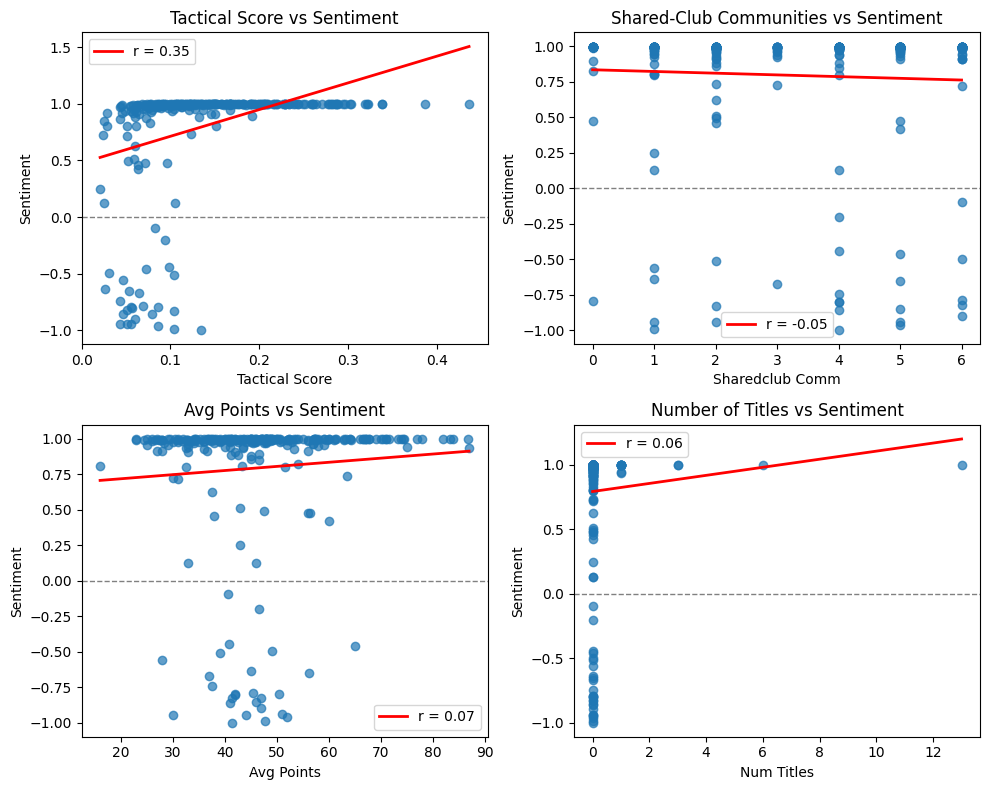

In [47]:
plot_correlation_subplots(
    managers_df,
    plots=[
        {"x": "tactical_score", "y": "sentiment", "title": "Tactical Score vs Sentiment"},
        {"x": "sharedclub_comm", "y": "sentiment", "title": "Shared-Club Communities vs Sentiment"},
        {"x": "avg_points", "y": "sentiment", "title": "Avg Points vs Sentiment"},
        {"x": "num_titles", "y": "sentiment", "title": "Number of Titles vs Sentiment"},
    ]
)


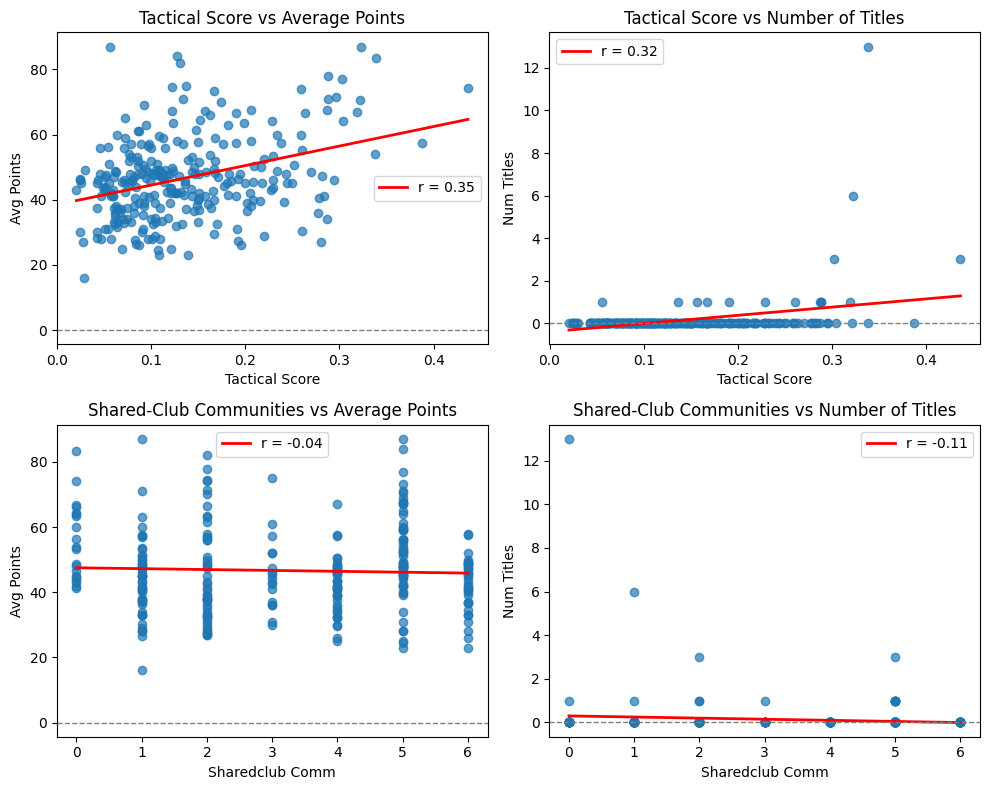

In [48]:
plot_correlation_subplots(
    managers_df,
    plots = [
    {
        "x": "tactical_score",
        "y": "avg_points",
        "title": "Tactical Score vs Average Points"
    },
    {
        "x": "tactical_score",
        "y": "num_titles",
        "title": "Tactical Score vs Number of Titles"
    },
    {
        "x": "sharedclub_comm",
        "y": "avg_points",
        "title": "Shared-Club Communities vs Average Points"
    },
    {
        "x": "sharedclub_comm",
        "y": "num_titles",
        "title": "Shared-Club Communities vs Number of Titles"
    }
]
)

# ERA
Here we briefly explore whether different coaching eras use different kinds of language.
To do this, managers are grouped by the period in which they began coaching, and we generate wordclouds showing the most influential terms for each era.
This step was mainly used to check for broad historical trends in wording and is not a central component of the report.

In [49]:
def plot_wordcloud(title, freq_dict, top_k=300):
    """
    Generic wordcloud plotting function
    """

    # Limit to top_k
    limited = dict(sorted(freq_dict.items(), key=lambda x: x[1], reverse=True)[:top_k])

    # Plot
    plt.figure(figsize=(10, 7))
    wc = WordCloud(width=1000, height=600, background_color="white")
    wc_img = wc.generate_from_frequencies(limited)

    plt.imshow(wc_img)
    plt.axis("off")
    plt.title(title, fontsize=18)
    plt.show()


In [50]:
names_era = [f"term_{i}" for i in range(num_terms)] + list(cleaned_texts.keys())

all_manager_keywords_era = {}

for m in cleaned_texts.keys():
    all_manager_keywords_era[m] = get_boosted_weights(
        manager_name=m,
        X_boosted=X_boosted,
        vocab=vocab,
        names=names_era,
        mean_term_vec=mean_term_vec
    )

In [51]:
all_years = sorted([yr for yr in manager_years.values() if yr is not None])

num_eras = 6
bins = np.array_split(all_years, num_eras)

eras = [(int(b[0]), int(b[-1])) for b in bins]

for i, (s, e) in enumerate(eras):
    print(f"Era {i}: {s}–{e}")

# Assign managers to a era
manager_to_era = {}

for m, yr in manager_years.items():
    if yr is None:
        continue
    for i, (start, end) in enumerate(eras):
        if start <= yr <= end:
            manager_to_era[m] = i
            break

# Managers grouped by era
era_managers = {i: [] for i in range(len(eras))}
for manager, era_idx in manager_to_era.items():
    era_managers[era_idx].append(manager)

era_keywords = {}

for era_idx, managers in era_managers.items():

    # Collect all tactical words from all managers in this era
    combined = []
    for m in managers:
        combined.extend(all_manager_keywords_era[m])

    unique_words = {}
    for word, score in combined:
        if word not in unique_words or score > unique_words[word]:
            unique_words[word] = score

    sorted_unique = sorted(unique_words.items(), key=lambda x: x[1], reverse=True)

    era_keywords[era_idx] = sorted_unique[:500]


Era 0: 1992–1993
Era 1: 1993–1998
Era 2: 1998–2006
Era 3: 2007–2013
Era 4: 2014–2018
Era 5: 2018–2025


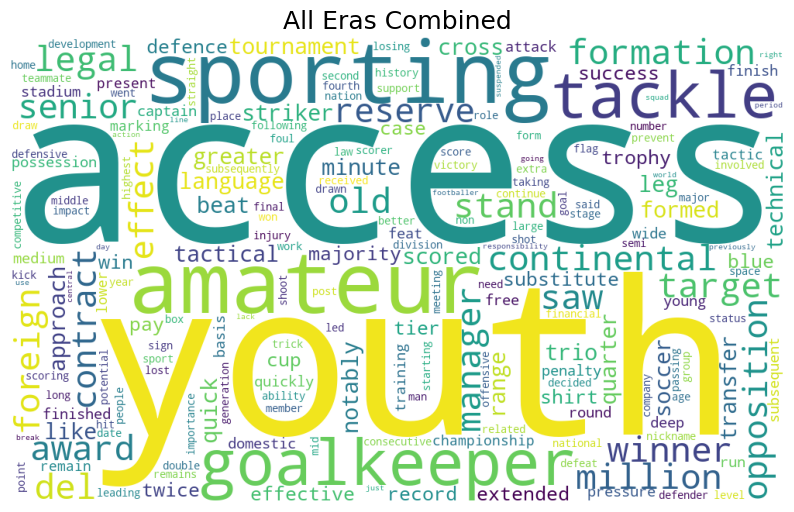

In [52]:
# Collect tactical words from ALL managers
all_combined = []
for m, words in all_manager_keywords_era.items():
    all_combined.extend(words)   # list of (word, score)

global_unique = {}
for word, score in all_combined:
    if word not in global_unique or score > global_unique[word]:
        global_unique[word] = score

global_sorted = sorted(global_unique.items(), key=lambda x: x[1], reverse=True)

global_top_words = dict(global_sorted[:500])

plot_wordcloud("All Eras Combined", global_top_words, top_k=500)


This combined wordcloud highlights the tactical and descriptive terms that appear most frequently across all managers. It represents the general vocabulary baseline before comparing how wording changes between eras.

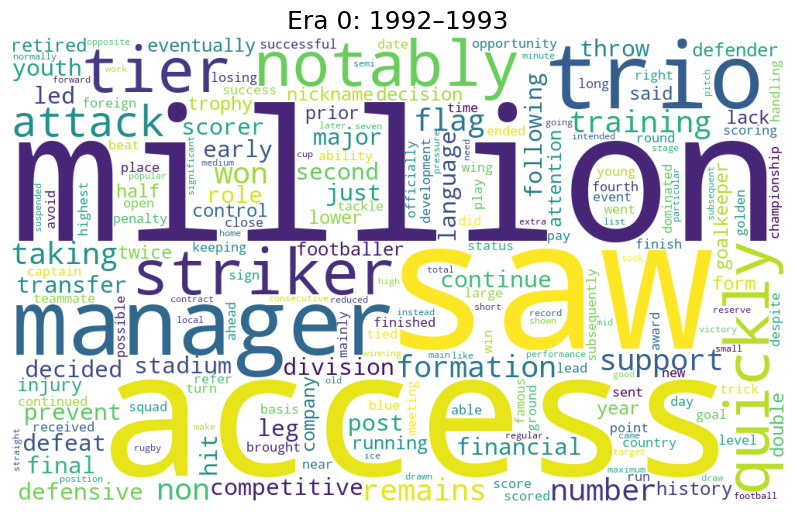

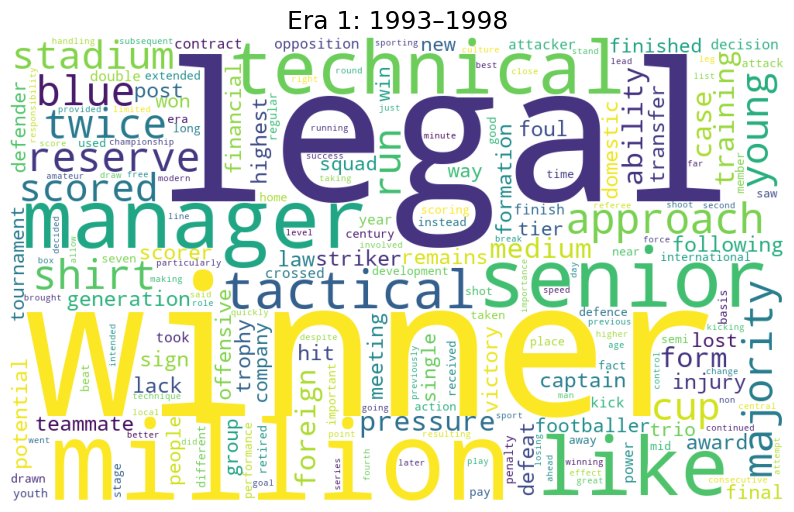

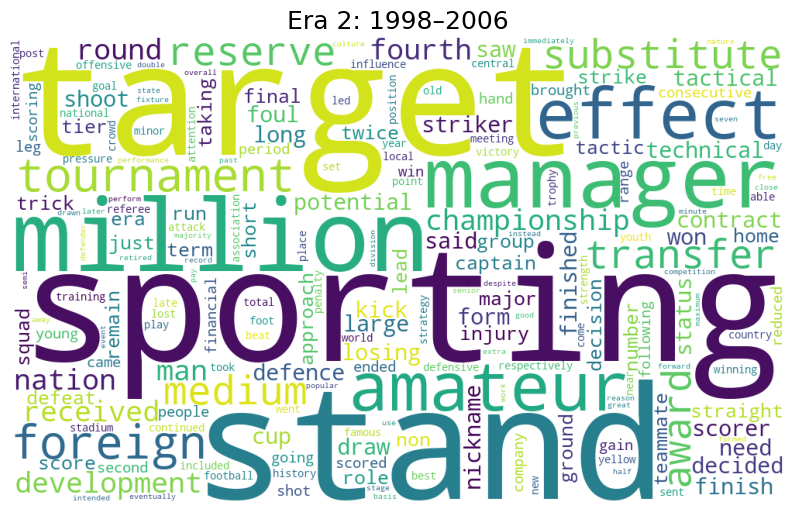

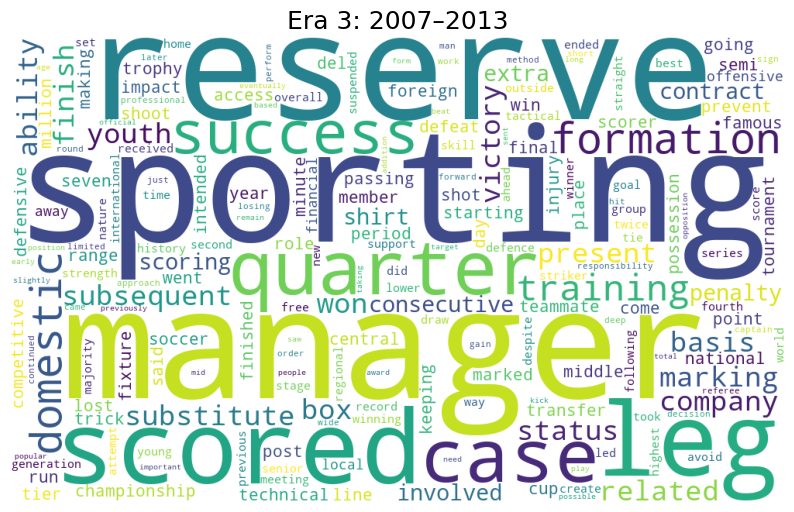

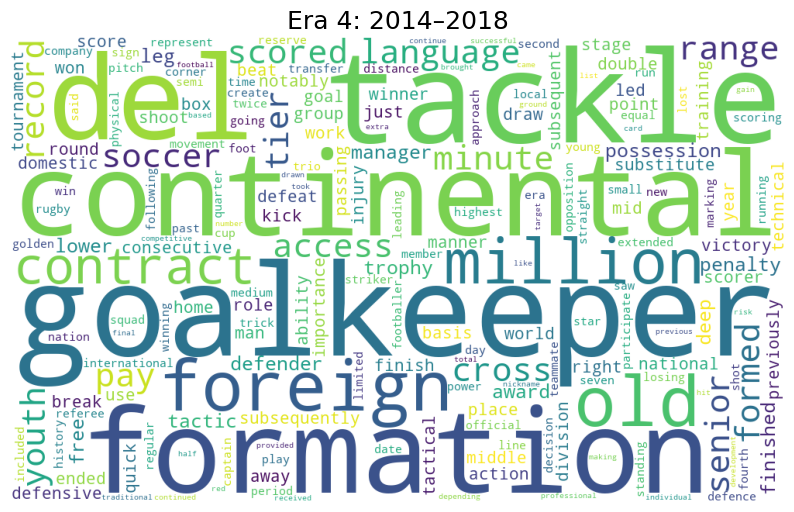

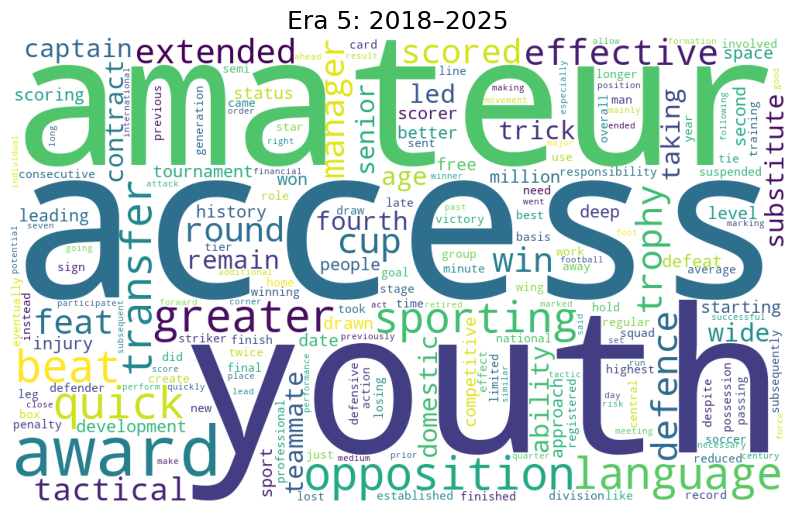

In [53]:
for era_idx, (s, e) in enumerate(eras):
    freq = dict(era_keywords[era_idx])
    plot_wordcloud(f"Era {era_idx}: {s}–{e}", freq)


The wordclouds show that different eras highlight different tactical themes. Early periods tend to emphasise terms like “saw”, “striker”, “formation”, and “tier”, while later eras shift toward words such as “sporting”, “training”, “reserve”, “success”, and “manager”. These differences suggest that tactical language evolves across generations of managers, even though some foundational terms remain consistent throughout.